In [1]:
import glob
import gc
import random

import numpy as np
import pandas as pd

from scipy.stats import median_abs_deviation, percentileofscore

import matplotlib.pyplot as plt
import seaborn as sns

import scanpy as sc

import pegasus as pg
from pegasusio import UnimodalData, MultimodalData

from tqdm import tqdm

%matplotlib inline

sc.settings.n_jobs = 25

random.seed(0)
np.random.seed(0)
sc.settings.seed = 0

In [2]:
SHIN_SRR_FOLDERS = glob.glob('/mnt/sdb/scz_meta_analysis_processed/shin_nowakowski/star_outputs/*_Solo.out/')

In [3]:
## From Cellbender Import ##

shin_adata = sc.read_h5ad('/mnt/sdb/scz_meta_analysis_processed/studies/shin_nowakowski/anndata_objs/shin_cellbendered.h5ad')

shin_adata.obs['Run'] = [i.split('_')[0] for i in shin_adata.obs_names]

shin_adata.obs['barcodes'] = shin_adata.obs_names

# filter ambient rna
shin_adata = shin_adata[shin_adata.obs['cell']].copy()

In [4]:
## Add Donor Labels ##

# Read in Vireo Assignments #
minMAF01_minCount10 = pd.read_csv('/mnt/sdb/scz_meta_analysis_processed/studies/shin_nowakowski/anndata_objs/minMAF_0pt1_minCount_10.csv', 
                                  index_col=0)

## Then Add Column for SRR+Donor ##
minMAF01_minCount10.rename({'cell':'original_barcode'}, axis=1, inplace=True)

minMAF01_minCount10['barcode'] = minMAF01_minCount10['library'] + '_' + minMAF01_minCount10['original_barcode']

## Then Merge ##

shin_adata.obs = shin_adata.obs.merge(minMAF01_minCount10, left_on=['barcodes', 'library'], right_on=['barcode', 'library'], how='left')

# barcodes are from shin_adata and barcode is from vireo (cellbender filtered)
shin_adata.obs.index = shin_adata.obs['barcodes']

# Create Donor (doublets and unassigned included) & Barcode-Donor
shin_adata.obs['Donor'] = shin_adata.obs['donor_id'].str.split('_').apply(lambda x: x[0] if isinstance(x, list) else x)

shin_adata.obs['Barcode_Donor'] = shin_adata.obs_names + '_' + shin_adata.obs['Donor']

shin_adata.obs['Run_Donor'] = shin_adata.obs['Run'] + '_' + shin_adata.obs['Donor']

In [5]:
## Remove Undemuxable Cells & Vireo Doublets ##

shin_adata = shin_adata[(shin_adata.obs['Donor'] != 'unassigned') & (shin_adata.obs['Donor'] != 'doublet')].copy()

In [6]:
## Rename Known Swaps ##

# Sample GSM7847323 was sequenced 4x SRR26424585-88. Bams are low quality and 3/4 runs call 3577-3 as WTC10
# with known swap from Nowakowski lab, communicated by David Shin #

shin_adata.obs['Run_Donor'] = shin_adata.obs['Run_Donor'].str.replace('SRR26424586_3577-3', 'SRR26424586_WTC11')

shin_adata.obs.loc[((shin_adata.obs['Run'] == 'SRR26424586') & (shin_adata.obs['Donor'] == '3577-3')), 'Donor'] = 'WTC11'

## SRR26424589 contains a donor 28815 with no genotype

shin_adata = shin_adata[shin_adata.obs['Run_Donor'] != 'SRR26424589_7215-32'].copy()

## SRR26424568 was not included in original study because it contains a control, 1323-4 sequenced without case line ##

shin_adata = shin_adata[shin_adata.obs['Run'] != 'SRR26424568'].copy()

In [7]:
## Cell Count After Demux ##

shin_adata.shape[0]

254109

In [8]:
## Merge SRA Metadata ##

shin_sra_metadata = pd.read_csv('/mnt/sda/scz_meta_analysis/shin_nowakowski_cellstemcell_2025/metadata/Shin_SRA_RunTable_David_Fixed_Kaji_Corrected.csv')

# restrict to useful columns #
shin_sra_metadata_essential = shin_sra_metadata[['Run', 'BioProject', 'BioSample', 'cell_line',
                                                 'vireo_adjusted_cell_line', 'Center Name',
                                                 'Experiment', 'genotype', 'Instrument', 'Library Name', 
                                                 'ReleaseDate', 'create_date', 'Sample Name', 'Differentiation']]

# Format Vireo Cell Line Columns So Each Run_Donor is its Own Line #
# Note: This vireo cell line columns contains vireo predictions that resolve donor swaps #

shin_sra_metadata_essential['vireo_adjusted_cell_line'] = shin_sra_metadata_essential['vireo_adjusted_cell_line'].str.replace("\\", "",
                                                                                                                              regex=False)
shin_sra_metadata_essential['vireo_adjusted_cell_line'] = shin_sra_metadata_essential['vireo_adjusted_cell_line'].str.split(",")

# one row per Run-cell_line #
shin_sra_metadata_essential = shin_sra_metadata_essential.explode('vireo_adjusted_cell_line')

# format WTC11-22q11del clone to match metadata #
shin_sra_metadata_essential['vireo_adjusted_cell_line'] = shin_sra_metadata_essential['vireo_adjusted_cell_line'].str.strip()
shin_sra_metadata_essential['vireo_adjusted_cell_line'] = shin_sra_metadata_essential['vireo_adjusted_cell_line'].str.replace('WTC11-22qdelCRISPR2',
                                                                                                                              'WTC11-CRISPR2')

# Cellsnp-lite & Vireo call the line 2909 whereas metadata calls it 29098A adapt for merging with metadata
shin_sra_metadata_essential['vireo_adjusted_cell_line'] = shin_sra_metadata_essential['vireo_adjusted_cell_line'].str.replace('29098A', '2909')
shin_sra_metadata_essential['vireo_adjusted_cell_line'] = shin_sra_metadata_essential['vireo_adjusted_cell_line'].str.replace('6OC2', '60C2')

## Fix typos and whitespace in Differentiation Column ##

shin_sra_metadata_essential['Differentiation'] = shin_sra_metadata_essential['Differentiation'].str.replace('Thalamic Organoids', 
                                                                                                            'Thalamic Organoid')
shin_sra_metadata_essential['Differentiation'] = shin_sra_metadata_essential['Differentiation'].str.replace('Cortical Organoids',
                                                                                                            'Cortical Organoid')
shin_sra_metadata_essential['Differentiation'] = shin_sra_metadata_essential['Differentiation'].str.strip()

# Create Donor Columns #

# WTC10 and WTC11 are clones of the same WTC11 donor #
shin_sra_metadata_essential['Donor'] = shin_sra_metadata_essential['vireo_adjusted_cell_line'].str.replace('WTC10', 'WTC11')
# Donor Column Reflects Identity of Original Donor and in hESCs will not distinguish between CRISPRd deletions #
shin_sra_metadata_essential['Donor'] = shin_sra_metadata_essential['Donor'].str.replace('WTC11-CRISPR2', 'WTC11')

shin_sra_metadata_essential['Run_Donor'] = shin_sra_metadata_essential['Run'] + '_' + shin_sra_metadata_essential['Donor']

## Merge ##

shin_adata.obs = shin_adata.obs.merge(shin_sra_metadata_essential, left_on=['Run', 'Donor', 'Run_Donor'], 
                                                                   right_on=['Run', 'Donor', 'Run_Donor'], how='left')

shin_adata.obs.index = shin_adata.obs['barcodes']

/tmp/ipykernel_127033/2429347142.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  shin_sra_metadata_essential['vireo_adjusted_cell_line'] = shin_sra_metadata_essential['vireo_adjusted_cell_line'].str.replace("\\", "",
/tmp/ipykernel_127033/2429347142.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  shin_sra_metadata_essential['vireo_adjusted_cell_line'] = shin_sra_metadata_essential['vireo_adjusted_cell_line'].str.split(",")


In [9]:
## Cells For Each Lineage After Demuxing ##

shin_adata.obs['Differentiation'].value_counts()

Differentiation
Thalamic Organoid    207073
Cortical Organoid     37859
Mixed Organoids        9177
Name: count, dtype: int64

In [10]:
## Merge Success Check ##

shin_adata.obs[shin_adata.obs['Library Name'].isnull()][['Donor']].value_counts()

# merge only failed on unassigned and doublet cells which will be removed after QC #

Series([], Name: count, dtype: int64)

In [11]:
## Map NCBI Gene Names w/Prasanth's File ##

# load prasanth's annotation file
prasanth_annot = pd.read_csv('/home/deepak/datasets/annotations/all_genes_EnsemblInfo_104.csv')

# merge prasanth's gene info into the var dataframe
shin_adata.var['ensembl_gene_id'] = shin_adata.var.index
shin_adata.var = shin_adata.var.merge(prasanth_annot, left_on='ensembl_gene_id', right_on='ensembl_gene_id', how='left')
shin_adata.var.chromosome_name = shin_adata.var.chromosome_name.astype('str')

# fix gene name that is NaN
shin_adata.var.loc[shin_adata.var['hgnc_symbol'].isna(),'hgnc_symbol'] = shin_adata.var.loc[shin_adata.var['hgnc_symbol'].isna(),'ensembl_gene_id']

#reset the index as the hgnc_symbol
shin_adata.var.index = shin_adata.var['hgnc_symbol']
shin_adata.var.index.name = None

#some ensembls map to same hgnc so we make them unique
shin_adata.var_names_make_unique(join='#')

gc.collect()

/tmp/ipykernel_127033/4159584338.py:4: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  prasanth_annot = pd.read_csv('/home/deepak/datasets/annotations/all_genes_EnsemblInfo_104.csv')


551

In [12]:
## Donor Metadata From Supplementary Table 1 of Paper ##

# Read in Metadata #
shin_donor_metadata = pd.read_csv('/mnt/sda/scz_meta_analysis/shin_nowakowski_cellstemcell_2025/metadata/Shin_Supplementary_Table_1.csv')


# Create WTC10 Row In MetaData (same donor as WTC11 but different clone) #

# Get the WTC11 row
wtc11_row = shin_donor_metadata.loc[shin_donor_metadata["Cell Line"] == "WTC11"].copy()

# Change the cell line name
wtc11_row["Cell Line"] = "WTC10"

# 2909 row # 
# Sex imputed from genotyping, not confirmed clinical metadata #
_2909_row = {"Cell Line": "2909", "Genotype": "Control", "Sex": "Female", "Donor Age": "Unknown", "Ethnicity": "Unknown",
           "Cell Type of Origin": "Unknown", "Derived by": "Unknown", "Diagnosis": "None"}

# Append to dataframe
shin_donor_metadata = pd.concat([shin_donor_metadata, wtc11_row, pd.DataFrame([_2909_row])], ignore_index=True)

# shin_donor_metadata.rename({'Diagnosis': 'Clinical_Notes'}, axis=1, inplace=True)

# # Rename Columns to Create Common Diagnosis Column Across Studies #
# shin_donor_metadata['Diagnosis'] = shin_donor_metadata['Genotype']

## Merge
shin_adata.obs = shin_adata.obs.merge(shin_donor_metadata, 
                                            left_on='vireo_adjusted_cell_line', 
                                            right_on='Cell Line', how='left').set_index('barcodes')

In [13]:
## Confirming That Only Unassigned and Donors Don't Take On Metadata ##

shin_adata.obs[shin_adata.obs['Sex'].isnull()]['Donor'].value_counts()

Series([], Name: count, dtype: int64)

In [14]:
print(shin_adata.obs.shape[0])
print(shin_adata.obs['Sex'].value_counts())

## Note of of the Donor IDs don't have a Sex ##
# We will need to Impute Later ##

254109
Sex
Male      211097
Female     43012
Name: count, dtype: int64


In [15]:
## Remove Duplicate Barcodes ##

print(shin_adata.obs_names.duplicated(keep=False).any())
print(shin_adata.var_names.duplicated(keep=False).any())

# None

False
False


In [16]:
## Set Up QC Metrics ##

# filter on robust genes
# annotate_robust_genes_scanpy(integrated, percent_cells=0.05)
pg.identify_robust_genes(shin_adata, percent_cells=0.05)
shin_adata = shin_adata[:,shin_adata.var['robust']].copy()
gc.collect()

# mitochondrial genes, "MT-" for human, "Mt-" for mouse
shin_adata.var["mt"] = shin_adata.var_names.str.startswith("MT-")
# ribosomal genes
shin_adata.var["ribo"] = shin_adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes
shin_adata.var["hb"] = shin_adata.var_names.str.contains("^HB[^(P)]")

# add protein_coding genes
shin_adata.var['protein_coding'] = shin_adata.var['gene_biotype'].apply(lambda x: True if 'protein_coding' == x else False)
shin_adata.var['protein_coding'] = shin_adata.var['protein_coding'].astype('bool')

# define mitocarta_genes
mitocarta_df = pd.read_csv('/home/deepak/datasets/annotations/Human.MitoCarta3.0.csv')
shin_adata.var['mitocarta'] = [True if x in list(mitocarta_df['Symbol']) else False for x in shin_adata.var.index]

# define robust_protein_coding genes (exclude ribosomal (RPL,RPS), mitochondrial, or mitocarta genes
shin_adata.var['robust_protein_coding'] = shin_adata.var['robust'] & shin_adata.var['protein_coding']
shin_adata.var.loc[shin_adata.var.ribo, 'robust_protein_coding'] = False
shin_adata.var.loc[shin_adata.var.mt, 'robust_protein_coding'] = False
shin_adata.var.loc[shin_adata.var.mitocarta, 'robust_protein_coding'] = False

# define robust_protein_coding_autosome genes (exclude ribosomal (RPL,RPS), mitochondrial, or mitocarta genes
shin_adata.var['autosome'] = shin_adata.var.chromosome_name.isin([str(i) for i in range(1,23)])
shin_adata.var['robust_protein_coding_autosome'] = shin_adata.var['robust_protein_coding'] & shin_adata.var['autosome'] 

2026-04-09 23:30:47,574 - pegasus.tools.preprocessing - INFO - After filtration, 31088/33538 genes are kept. Among 31088 genes, 21392 genes are robust.
2026-04-09 23:30:47,575 - pegasus.tools.preprocessing - INFO - Function 'identify_robust_genes' finished in 3.32s.


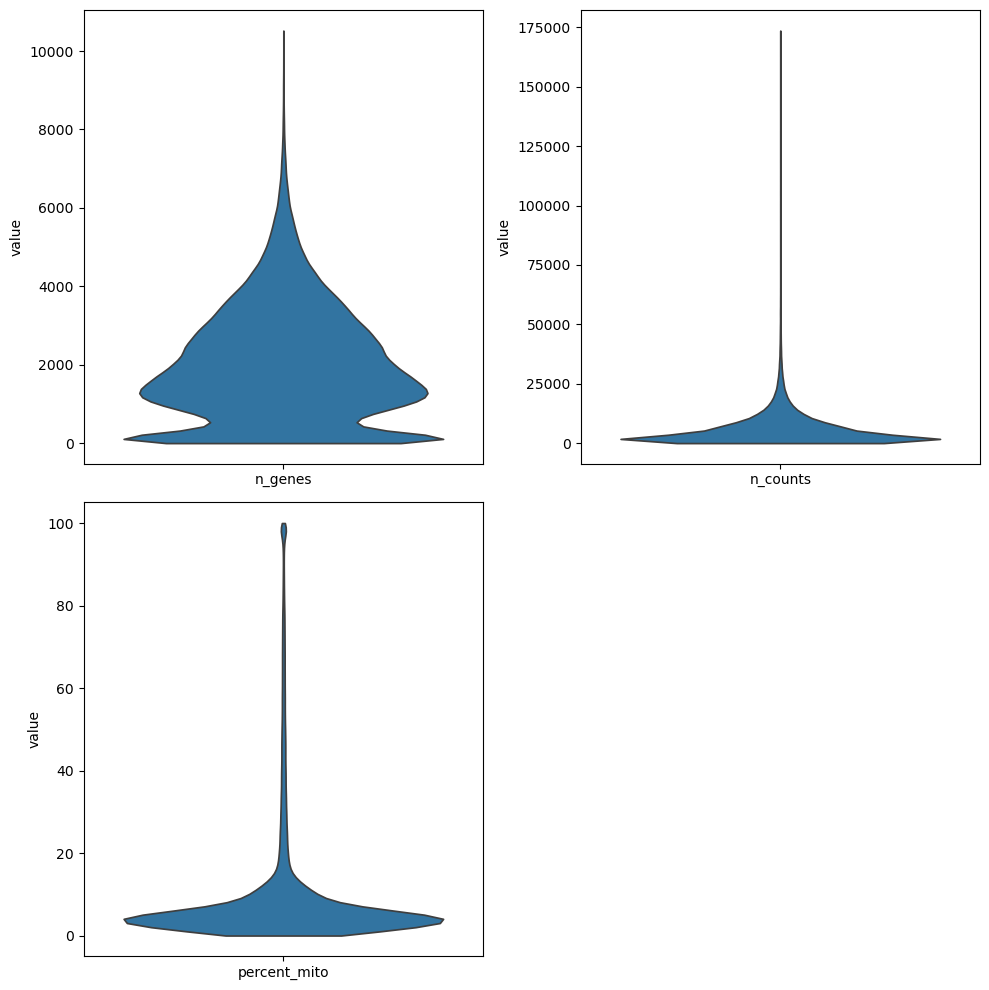

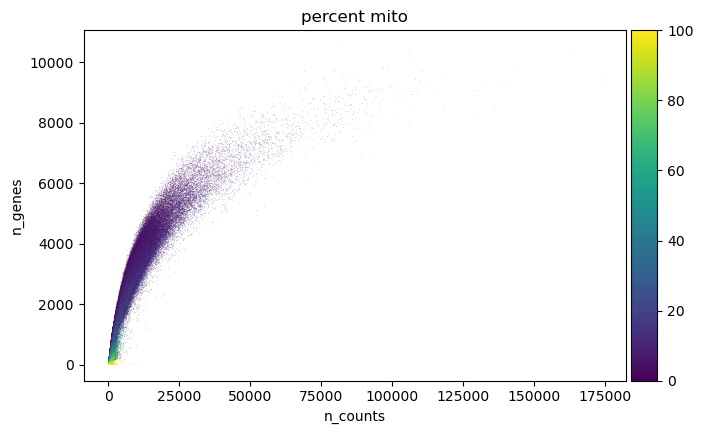

The 99th percentile all sample genes/cell is: 4740.0
The 99th percentile all sample total counts/cell is: 18941.0
The 99th percentile all sample mitochondrial % /cell is: 44.28163091920991


In [17]:
## Plot QC Metrics ##

# QC by counts #
# convert to pegasus unimodal object
shin_adata = UnimodalData(shin_adata)
pg.qc_metrics(shin_adata, mito_prefix='MT-')

# Create a figure with 3 subplots

# convert back for plotting to scanpy anndata
shin_adata = shin_adata.to_anndata()
fig, axes = plt.subplots(2, 2, figsize=(10, 10))
axes = axes.flatten()
sc.pl.violin(shin_adata, "n_genes", ax=axes[0], show=False, stripplot=False)
sc.pl.violin(shin_adata, "n_counts", ax=axes[1], show=False, stripplot=False)
sc.pl.violin(shin_adata, "percent_mito", ax=axes[2], show=False, stripplot=False)
fig.delaxes(axes[3])
plt.tight_layout()

sc.pl.scatter(shin_adata, "n_counts", "n_genes", color="percent_mito")

print('The 99th percentile all sample genes/cell is: {0}'.format(np.percentile(shin_adata.obs['n_genes'], 95)))

print('The 99th percentile all sample total counts/cell is: {0}'.format(np.percentile(shin_adata.obs['n_counts'], 95)))

print('The 99th percentile all sample mitochondrial % /cell is: {0}'.format(np.percentile(shin_adata.obs['percent_mito'], 95)))

n_UMIs lower: 373 upper: 38946
n_genes lower: 362 upper: 8876


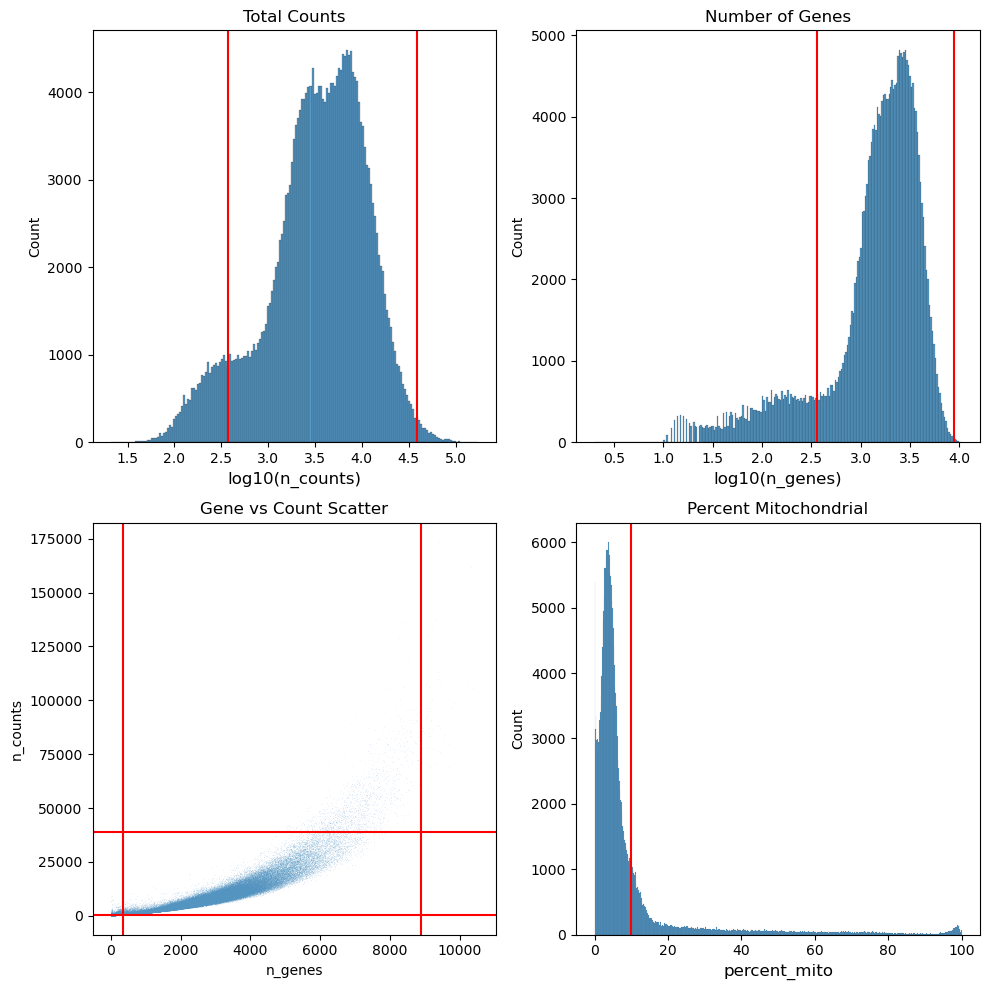

In [18]:
## Visualizating QC Cutoffs ##

MAD = 3

def qc_boundary(counts, k=MAD):
    x = np.log1p(counts)
    mad = median_abs_deviation(x)
    return np.exp(np.median(x) - k*mad), np.exp(np.median(x) + k*mad)

### nUMI and nGene QCs
n_counts_lower, n_counts_upper = qc_boundary(shin_adata.obs.n_counts, k=MAD)
print('n_UMIs lower: %d upper: %d' % (n_counts_lower, n_counts_upper))

n_genes_lower, n_genes_upper = qc_boundary(shin_adata.obs.n_genes, k=MAD)
print('n_genes lower: %d upper: %d' % (n_genes_lower, n_genes_upper))

## Plot Changes to Counts and Genes/Cell Distributions ##

fig, axs = plt.subplots(2, 2, figsize=(10, 10))  # 2x2 grid, adjust size as needed

# Plot 1: log10(n_counts)
sns.histplot(np.log10(shin_adata.obs.n_counts), ax=axs[0, 0])
axs[0, 0].axvline(np.log10(n_counts_lower), color='red')
axs[0, 0].axvline(np.log10(n_counts_upper), color='red')
axs[0, 0].set_xlabel('log10(n_counts)', fontsize=12)
axs[0, 0].set_title("Total Counts")

# Plot 2: log10(n_genes)
sns.histplot(np.log10(shin_adata.obs.n_genes), ax=axs[0, 1])
axs[0, 1].axvline(np.log10(n_genes_lower), color='red')
axs[0, 1].axvline(np.log10(n_genes_upper), color='red')
axs[0, 1].set_xlabel('log10(n_genes)', fontsize=12)
axs[0, 1].set_title("Number of Genes")

# Plot 3: scatter plot of n_genes vs n_counts
sns.scatterplot(x=shin_adata.obs.n_genes, y=shin_adata.obs.n_counts, alpha=0.5, s=0.1, ax=axs[1, 0])
axs[1, 0].axhline(n_counts_lower, color='red')
axs[1, 0].axhline(n_counts_upper, color='red')
axs[1, 0].axvline(n_genes_lower, color='red')
axs[1, 0].axvline(n_genes_upper, color='red')
axs[1, 0].set_xlabel('n_genes')
axs[1, 0].set_ylabel('n_counts')
axs[1, 0].set_title("Gene vs Count Scatter")

# Plot 4: percent_mito
sns.histplot(shin_adata.obs.percent_mito, ax=axs[1, 1])
axs[1, 1].axvline(10, color='red')
axs[1, 1].set_xlabel('percent_mito', fontsize=12)
axs[1, 1].set_title("Percent Mitochondrial")

plt.tight_layout()
plt.show()

n_cells before QC: 254109
n_cells after QC: 254109
mean n_cells before QC 9075.32142857143
mean n_cells after QC 9075.32142857143


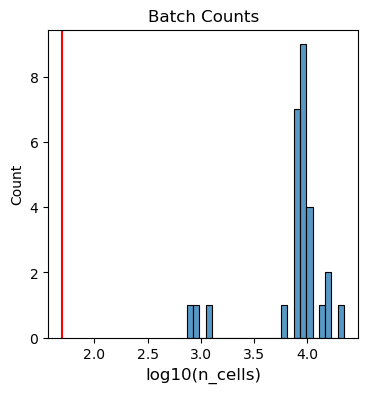

remove 0 batches that have cells less than 50


In [19]:
## Minimum Cell Cutoffs Based on Donor-Batches ##

args_min_n_cells = 50

n_cells_before_qc = shin_adata.obs.library.value_counts().rename_axis('library').reset_index(name='counts')
n_cells_after_qc = shin_adata.obs[shin_adata.obs.passed_qc].library.value_counts().rename_axis('library').reset_index(name='counts')

print('n_cells before QC:', np.sum(n_cells_before_qc[n_cells_before_qc.counts>0].counts))
print('n_cells after QC:', np.sum(n_cells_after_qc[n_cells_after_qc.counts>0].counts))

print('mean n_cells before QC', np.mean(n_cells_before_qc[n_cells_before_qc.counts>0].counts))
print('mean n_cells after QC', np.mean(n_cells_after_qc[n_cells_after_qc.counts>0].counts))

# Plot Distribution of Donor-Batches on Being Greater than Zero
plt.figure(figsize=(4, 4))
plt.title('Batch Counts')
sns.histplot(np.log10(n_cells_before_qc[n_cells_before_qc.counts>0].counts))
plt.axvline(np.log10(args_min_n_cells), color='red')
plt.xlabel('log10(n_cells)', fontsize=12)
plt.show()

### n_cells QC

#identify donor-batches with less than 50 cells of contribution
n_cells_outlier = list(n_cells_after_qc[n_cells_after_qc.counts<args_min_n_cells].library)
# set these to have failed QC as well
shin_adata.obs.loc[shin_adata.obs.library.isin(n_cells_outlier),'passed_qc'] = False
print('remove {0} batches that have cells less than {1}'.format(len(n_cells_outlier), args_min_n_cells))

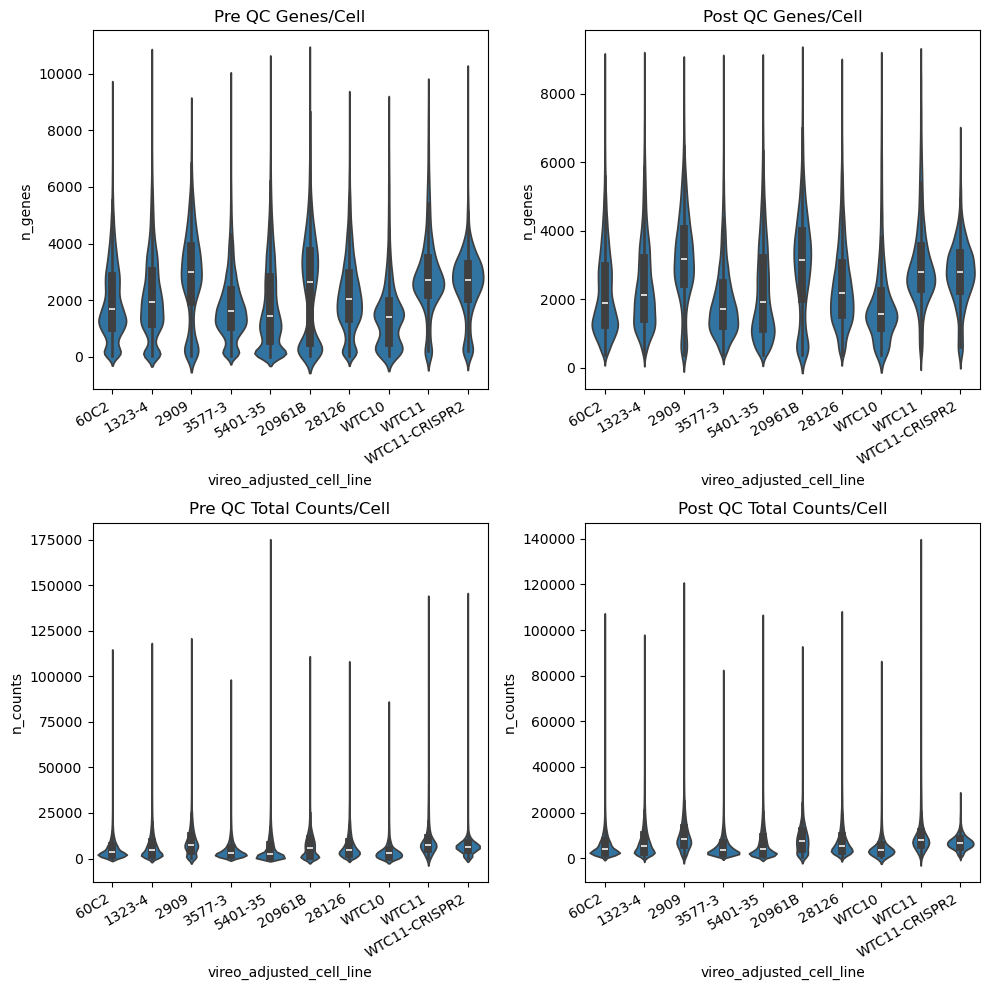

In [20]:
## Trialing QC Cutoffs Before and After ##

## Boolean Cutoffs for UMIs and Genes/Cell ##

counts_filter = (n_counts_lower < shin_adata.obs.n_genes) & (shin_adata.obs.n_genes < n_counts_upper)
genes_filter = (n_genes_lower < shin_adata.obs.n_genes) & (shin_adata.obs.n_genes < n_genes_upper)

# Plot Changes With Violins 

fig, axes = plt.subplots(2, 2, figsize=(10, 10))
axes = axes.flatten()
sns.violinplot(data=shin_adata.obs, y='n_genes', x='vireo_adjusted_cell_line', ax=axes[0])
axes[0].set_title('Pre QC Genes/Cell')
plt.setp(axes[0].get_xticklabels(), rotation=30, ha='right')

sns.violinplot(data=shin_adata.obs[counts_filter & genes_filter], x='vireo_adjusted_cell_line', y='n_genes', ax=axes[1])
axes[1].set_title('Post QC Genes/Cell')
plt.setp(axes[1].get_xticklabels(), rotation=30, ha='right')

sns.violinplot(data=shin_adata.obs, y='n_counts', x='vireo_adjusted_cell_line', ax=axes[2])
axes[2].set_title('Pre QC Total Counts/Cell')
plt.setp(axes[2].get_xticklabels(), rotation=30, ha='right')

sns.violinplot(data=shin_adata.obs[shin_adata.obs.passed_qc & genes_filter], x='vireo_adjusted_cell_line', y='n_counts', ax=axes[3])
axes[3].set_title('Post QC Total Counts/Cell')
plt.setp(axes[3].get_xticklabels(), rotation=30, ha='right')

plt.tight_layout()
plt.show()

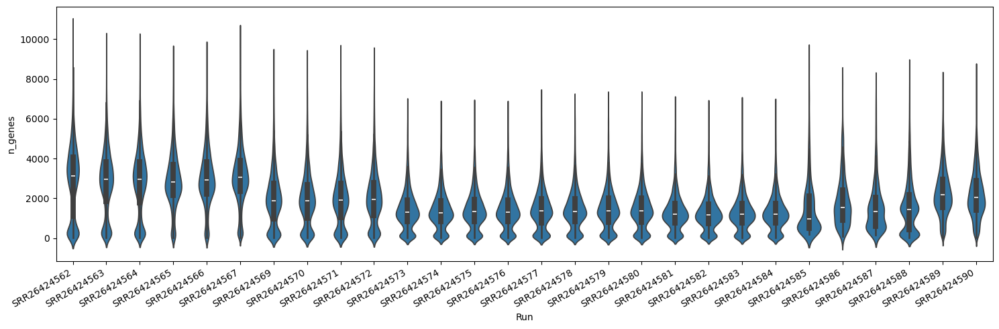

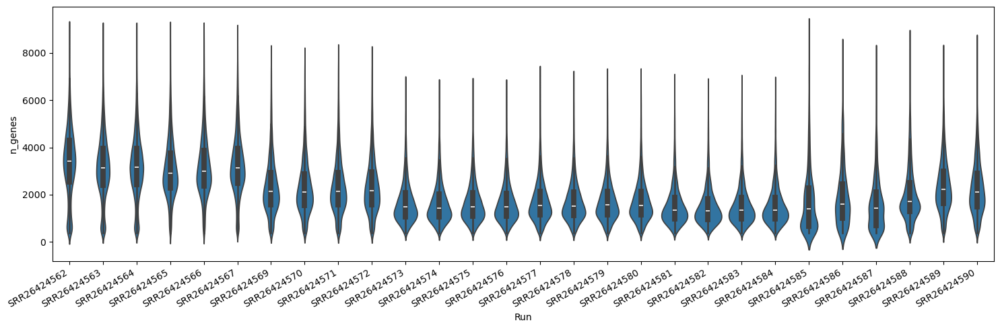

In [21]:
plt.figure(figsize=(15,5))
sns.violinplot(data=shin_adata.obs, x='Run', y='n_genes')
plt.xticks(rotation=30, ha='right')
plt.tight_layout()

plt.figure(figsize=(15,5))
sns.violinplot(data=shin_adata.obs[counts_filter & genes_filter], x='Run', y='n_genes')
plt.xticks(rotation=30, ha='right')
plt.tight_layout()

In [22]:
## Remove Cells That Don't Meet Total Counts/Cell and Genes/Cell Thresholds ##

shin_adata = MultimodalData(UnimodalData(shin_adata, modality="rna"))

pg.qc_metrics(shin_adata, 
              min_genes=n_genes_lower, max_genes=n_genes_upper,
              min_umis=n_counts_lower, max_umis=n_counts_upper,
              mito_prefix='MT-', percent_mito=10)

pg.filter_data(shin_adata)
gc.collect()
shin_adata = shin_adata.to_anndata()

2026-04-09 23:31:03,822 - pegasusio.qc_utils - INFO - After filtration, 194951 out of 254109 cell barcodes are kept in UnimodalData object unknown-rna.
2026-04-09 23:31:03,823 - pegasus.tools.preprocessing - INFO - Function 'filter_data' finished in 0.84s.


In [23]:
## Filter Cells and Genes With Raw Cutoffs #

# store raw counts in layer
shin_adata.layers["raw_counts"] = shin_adata.X

# Note: No cells fail this cutoff affter using MAD based filtration
print((shin_adata.obs.n_genes < 100).sum())
print((shin_adata.var.n_cells < 20).any())

# Doing This For Completeness
sc.pp.filter_cells(shin_adata, min_genes=100)
sc.pp.filter_genes(shin_adata, min_cells=20)

0
False


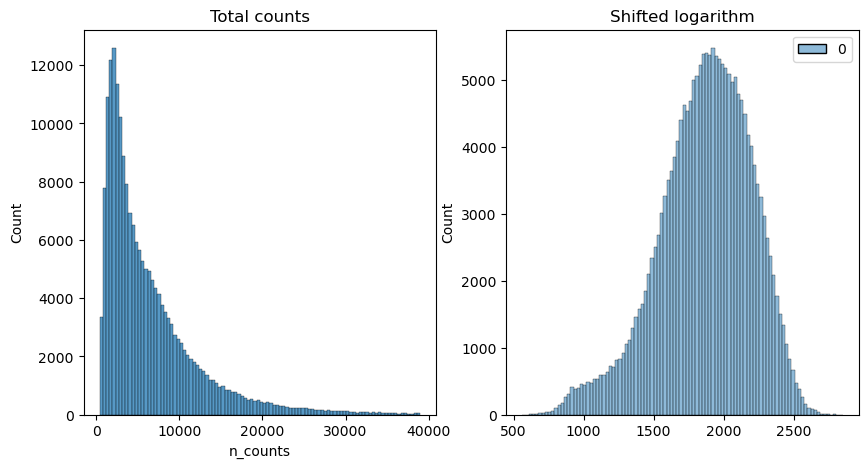

In [24]:
## Log Normalization ##

# normalize 
scales_counts = sc.pp.normalize_total(shin_adata, layer='raw_counts', target_sum=None, inplace=False)

# log1p transform
shin_adata.layers["log1p_norm"] = sc.pp.log1p(scales_counts["X"], copy=True)

# set X as log1p normed counts
shin_adata.X = shin_adata.layers["log1p_norm"]

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
p1 = sns.histplot(shin_adata.obs["n_counts"], bins=100, kde=False, ax=axes[0])
axes[0].set_title("Total counts")
p2 = sns.histplot(shin_adata.layers["log1p_norm"].sum(1), bins=100, kde=False, ax=axes[1])
axes[1].set_title("Shifted logarithm")
plt.show()

2026-04-09 23:31:22,041 - pegasus.tools.utils - INFO - Loaded signatures from GMT file /home/deepak/pixi_envs/pegasus/.pixi/envs/default/lib/python3.10/site-packages/pegasus/data_files/cell_cycle_human.gmt.
2026-04-09 23:31:22,044 - pegasus.tools.signature_score - INFO - Signature G1/S: 43 out of 43 genes are used in signature score calculation.
2026-04-09 23:31:22,729 - pegasus.tools.signature_score - INFO - Signature G2/M: 54 out of 54 genes are used in signature score calculation.
2026-04-09 23:31:23,582 - pegasus.tools.signature_score - INFO - Function 'calc_signature_score' finished in 3.20s.
2026-04-09 23:31:41,937 - pegasus.tools.preprocessing - INFO - Function 'pca' finished in 8.26s.


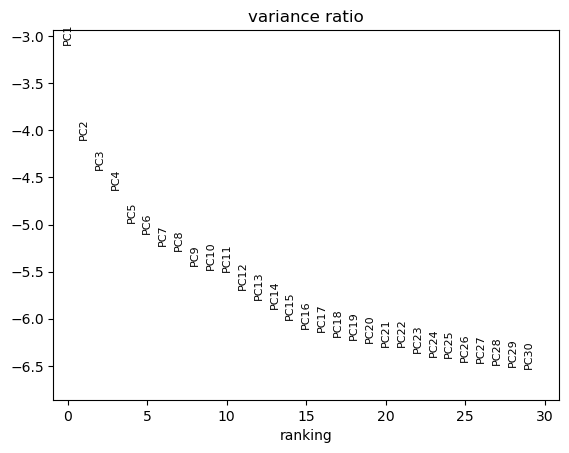

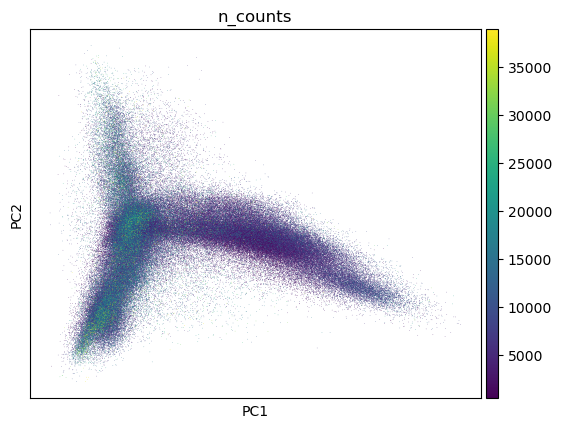

There is 15.811368861926345 variance explained by these components
2026-04-09 23:31:43,126 - pegasus.tools.preprocessing - INFO - Function 'regress_out' finished in 0.20s.
2026-04-09 23:31:43,131 - pegasus.tools.batch_correction - INFO - Start integration using Harmony.
	Initialization is completed.
	Completed 1 / 20 iteration(s).
	Completed 2 / 20 iteration(s).
	Completed 3 / 20 iteration(s).
	Completed 4 / 20 iteration(s).
	Completed 5 / 20 iteration(s).
	Completed 6 / 20 iteration(s).
	Completed 7 / 20 iteration(s).
Reach convergence after 7 iteration(s).
2026-04-09 23:32:30,119 - pegasus.tools.batch_correction - INFO - Function 'run_harmony' finished in 46.99s.
2026-04-09 23:32:49,898 - pegasus.tools.nearest_neighbors - INFO - Function 'get_neighbors' finished in 19.78s.
2026-04-09 23:32:52,962 - pegasus.tools.nearest_neighbors - INFO - Function 'calculate_affinity_matrix' finished in 3.06s.
2026-04-09 23:32:56,851 - pegasus.tools.graph_operations - INFO - Function 'construct_graph

/home/deepak/pixi_envs/pegasus/.pixi/envs/default/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Thu Apr  9 23:33:35 2026 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Thu Apr  9 23:34:45 2026 Finished embedding
2026-04-09 23:34:45,371 - pegasus.tools.visualization - INFO - Function 'umap' finished in 72.20s.


In [25]:
# Calculate Highly Variable Genes (not using deviance) ##

if not isinstance(shin_adata, UnimodalData):
    shin_adata = UnimodalData(shin_adata)

## ROUND 0 ##

# calc score requires a float downcast for some reason
shin_adata.X = shin_adata.X.astype('float32')
pg.calc_signature_score(shin_adata, 'cell_cycle_human')

# calculate HVGs on a protein_coding_autosomal only gene list
shin_hvg = shin_adata[:,shin_adata.var.robust_protein_coding_autosome].copy()
shin_hvg = shin_hvg.to_anndata()
hvg = sc.pp.highly_variable_genes(shin_hvg, layer='log1p_norm', n_top_genes=3000, inplace=False, subset=False)
hvg_list = shin_hvg.var.index[hvg.highly_variable].tolist()
del shin_hvg
gc.collect()

# apply that HVG list to your original anndata object
shin_adata.var['highly_variable_features'] = False
shin_adata.var['highly_variable_features'] = shin_adata.var.index.isin(hvg_list)

## Dimensionality Reduction ##

# PCA

if not isinstance(shin_adata, UnimodalData):
    shin_adata = UnimodalData(shin_adata)

pg.pca(shin_adata, n_components=30)
sc.pl.pca_variance_ratio(shin_adata, n_pcs=30, log=True)
sc.pl.pca_scatter(shin_adata.to_anndata(), color="n_counts")
plt.show()

print('There is {0} variance explained by these components'.format(shin_adata.uns['pca']['variance_ratio'].sum()*100))

# # Regress Out ##

pg.regress_out(shin_adata, ['n_counts', 'percent_mito'])

## Harmony  

pg.run_harmony(shin_adata, batch=['Donor'], rep='pca_regressed', max_iter_harmony=20, n_comps=30)

# # UMAP

pg.neighbors(shin_adata, rep='pca_regressed_harmony', use_cache=False, dist='l2', K=100, n_comps=30)
pg.leiden(shin_adata, rep='pca_regressed_harmony', resolution=0.1, class_label='class')
pg.umap(shin_adata, rep='pca_regressed_harmony', n_neighbors=15, rep_ncomps=30)
plt.show()

shin_adata = shin_adata.to_anndata()

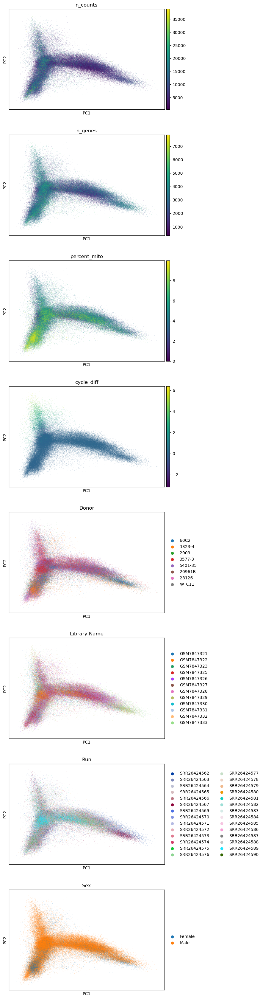

In [26]:
sc.pl.pca(shin_adata, color=["n_counts", "n_genes", "percent_mito", 'cycle_diff', 'Donor', 'Library Name', 'Run', 'Sex'], ncols=1)

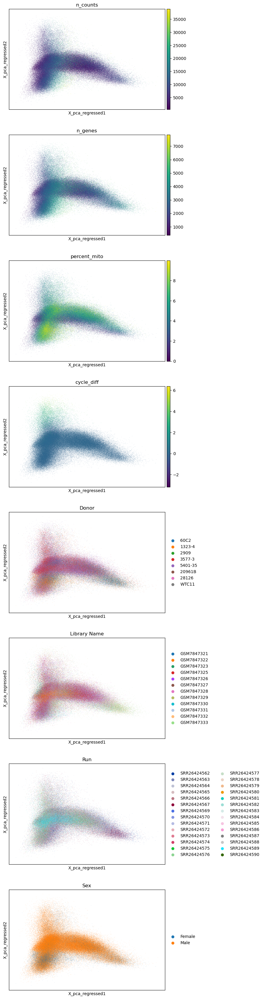

In [27]:
sc.pl.embedding(shin_adata, basis='X_pca_regressed', 
                color=["n_counts", "n_genes", "percent_mito", 'cycle_diff', 'Donor', 'Library Name', 'Run', 'Sex'], ncols=1)

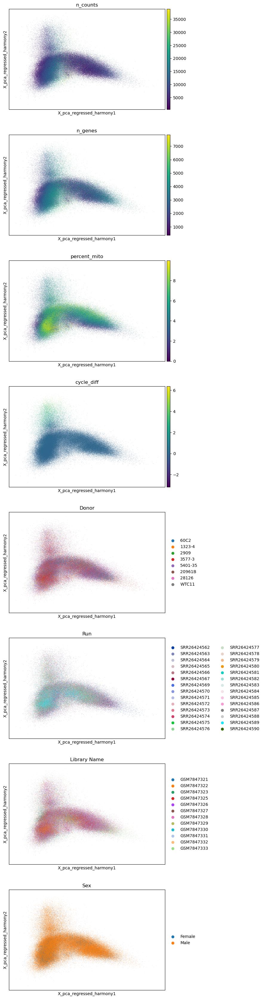

In [28]:
sc.pl.embedding(shin_adata, basis='X_pca_regressed_harmony', 
                color=["n_counts", "n_genes", "percent_mito", 'cycle_diff', 'Donor', 'Run', 'Library Name', 'Sex'], ncols=1)

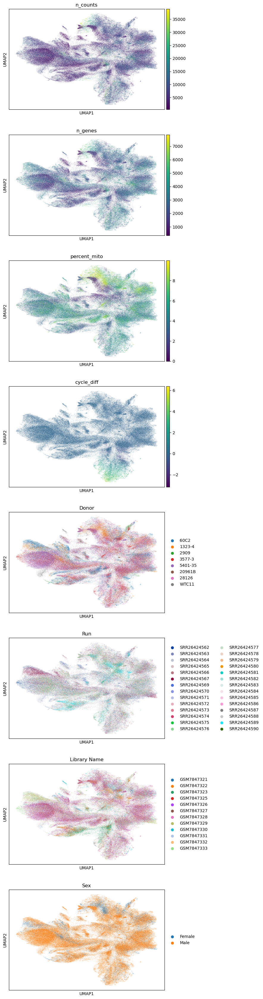

In [29]:
sc.pl.umap(shin_adata, color=["n_counts", "n_genes", "percent_mito", 'cycle_diff', 'Donor', 'Run', 'Library Name', 'Sex'], ncols=1)

In [30]:
# Add Day Label ##

# paper mentions "10 weeks of differentiation #

shin_adata.obs['Day'] = 70
shin_adata.obs['Manuscript'] = 'Shin'
shin_adata.obs['Protocol'] = 'Kriegstein (Bhaduri)'

## Impute Chemistry ##

# by crosslisting barcodes with whitelists, 10xv2 vs 10xv3 is inferred #

run_chemistry_dict = {
    "SRR26424562": "10xv3", "SRR26424563": "10xv3", "SRR26424564": "10xv3", "SRR26424565": "10xv3", "SRR26424566": "10xv3",
    "SRR26424567": "10xv3", "SRR26424568": "10xv2", "SRR26424569": "10xv3", "SRR26424570": "10xv3", "SRR26424571": "10xv3",
    "SRR26424572": "10xv3", "SRR26424573": "10xv3", "SRR26424574": "10xv3", "SRR26424575": "10xv3", "SRR26424576": "10xv3",
    "SRR26424577": "10xv3", "SRR26424578": "10xv3", "SRR26424579": "10xv3", "SRR26424580": "10xv3", "SRR26424581": "10xv3",
    "SRR26424582": "10xv3", "SRR26424583": "10xv3", "SRR26424584": "10xv3", "SRR26424585": "10xv2", "SRR26424586": "10xv2",
    "SRR26424587": "10xv2", "SRR26424588": "10xv2", "SRR26424589": "10xv2", "SRR26424590": "10xv2"}

srr_whitelist_dict = {srr: ("737K-august-2016" if chem == "10xv2" else "3M-february-2018_TRU") for srr, chem in run_chemistry_dict.items()}

shin_adata.obs['Chemistry'] = shin_adata.obs['Run'].apply(lambda x: run_chemistry_dict[x])

shin_adata.obs['Whitelist'] = shin_adata.obs['Run'].apply(lambda x: srr_whitelist_dict[x])

In [31]:
# Homogenize With Other Studies' Cell_Line Column

shin_adata.obs.rename({'Cell Line':'Cell_Line'}, inplace=True, axis=1)

del shin_adata.obs['n_vars'] # from Shin, part of their original QC
del shin_adata.obs['donor_id'] # from Shin, integrated as 'Donor' 
del shin_adata.obs['Barcode_Donor'] # from Shin, used for merging metadata in, no longer necessary
del shin_adata.obs['assigned'] # from Shin, integrated in obs as Diagnosis
del shin_adata.obs['genotype'] # from Shin, integrated in obs as Genotype
del shin_adata.obs['vireo_adjusted_cell_line'] # from Shin, integrated as Cell Line
del shin_adata.obs['cell_line'] # from Shin, integrated as Cell Line, Run, Donor (contains all lines in a given run)
del shin_adata.obs['barcode'] # from Shin, but redundant as barcodes 

# to deal with Shin Age of Sampling #

def parse_age(x):
    if x is None or x == "Unknown":
        return np.nan
    
    x = str(x)
    
    if "month" in x:
        return float(x.split()[0]) / 12
    
    if "-" in x:  # range like 30-34 years
        a, b = x.split()[0].split("-")
        return (float(a) + float(b)) / 2
    
    if "year" in x:
        return float(x.split()[0])
    
    return np.nan

shin_adata.obs["Donor Age"] = shin_adata.obs["Donor Age"].apply(parse_age)

In [32]:
## Save Step ##

shin_adata.obs['Diagnosis'] = shin_adata.obs['Diagnosis'].astype('str')
shin_adata.write_h5ad('/mnt/sdb/scz_meta_analysis_processed/studies/shin_nowakowski/anndata_objs/shin_qc.h5ad')

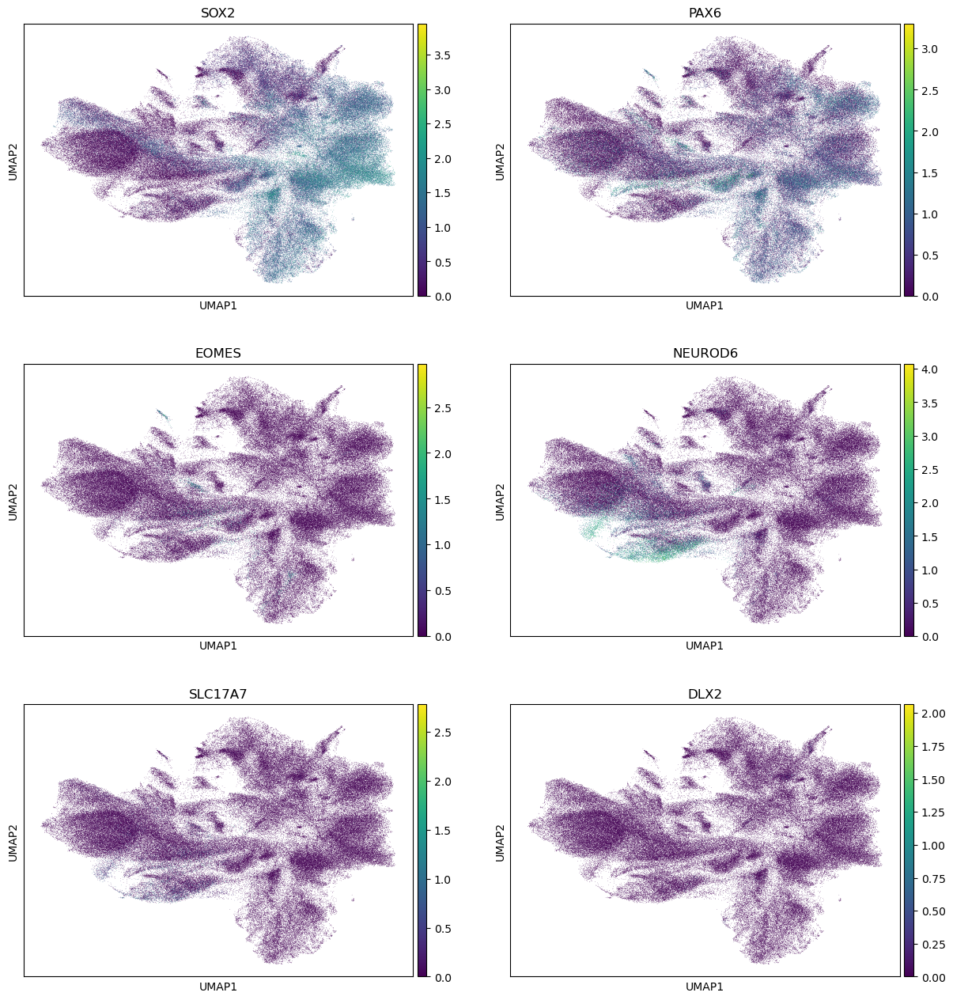

In [33]:
sc.pl.umap(shin_adata, color=['SOX2', 'PAX6', 'EOMES', 'NEUROD6', 'SLC17A7', 'DLX2'], ncols=2)

In [34]:
shin_adata[shin_adata.obs['Differentiation'] == 'Cortical Organoid'].shape

(32100, 21392)

In [35]:
shin_adata[shin_adata.obs['Differentiation'] == 'Thalamic Organoid'].shape

(156448, 21392)

In [36]:
## Create Cortical and Thalamic Datasets and Save Them ##

shin_adata_ctx = shin_adata[shin_adata.obs['Differentiation'] == 'Cortical Organoid'].copy()
shin_adata_ctx.write_h5ad('/mnt/sdb/scz_meta_analysis_processed/studies/shin_nowakowski/anndata_objs/shin_ctx_qc.h5ad')

shin_adata_thal = shin_adata[shin_adata.obs['Differentiation'] == 'Thalamic Organoid'].copy()
shin_adata_thal.write_h5ad('/mnt/sdb/scz_meta_analysis_processed/studies/shin_nowakowski/anndata_objs/shin_thal_qc.h5ad')

In [37]:
shin_adata_thal.shape[0]

156448

In [38]:
shin_adata_ctx.shape[0]

32100